# **Exploratory Data Analysis**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
import statsmodels.formula.api as smf
plt.rcParams['figure.figsize'] = (10,7)
plt.rcParams['figure.dpi'] = 750
sns.set_style('darkgrid')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("/content/ToyotaCorolla - MLR.csv")

In [4]:
df

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170
...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,4,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,4,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,4,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,4,5,1015


In [5]:
df.head()

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170


In [6]:
df.shape

(1436, 11)

In [7]:
df.describe()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,1436.000000,1436.0,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,0.055710,1576.85585,4.033426,4.0,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.229441,424.38677,0.952677,0.0,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,0.000000,1300.00000,2.000000,4.0,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,0.000000,1400.00000,3.000000,4.0,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,0.000000,1600.00000,4.000000,4.0,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,0.000000,1600.00000,5.000000,4.0,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,1.000000,16000.00000,5.000000,4.0,6.000000,1615.00000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Price      1436 non-null   int64 
 1   Age_08_04  1436 non-null   int64 
 2   KM         1436 non-null   int64 
 3   Fuel_Type  1436 non-null   object
 4   HP         1436 non-null   int64 
 5   Automatic  1436 non-null   int64 
 6   cc         1436 non-null   int64 
 7   Doors      1436 non-null   int64 
 8   Cylinders  1436 non-null   int64 
 9   Gears      1436 non-null   int64 
 10  Weight     1436 non-null   int64 
dtypes: int64(10), object(1)
memory usage: 123.5+ KB


In [9]:
df.duplicated().sum()

1

In [10]:
df[df.duplicated(keep = False)]

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
112,24950,8,13253,Diesel,116,0,2000,5,4,5,1320
113,24950,8,13253,Diesel,116,0,2000,5,4,5,1320


In [11]:
df.drop_duplicates(inplace= True)

In [12]:
df.shape

(1435, 11)

In [13]:
df.isnull().sum()

Price        0
Age_08_04    0
KM           0
Fuel_Type    0
HP           0
Automatic    0
cc           0
Doors        0
Cylinders    0
Gears        0
Weight       0
dtype: int64

# **Data Visualization**

<Axes: >

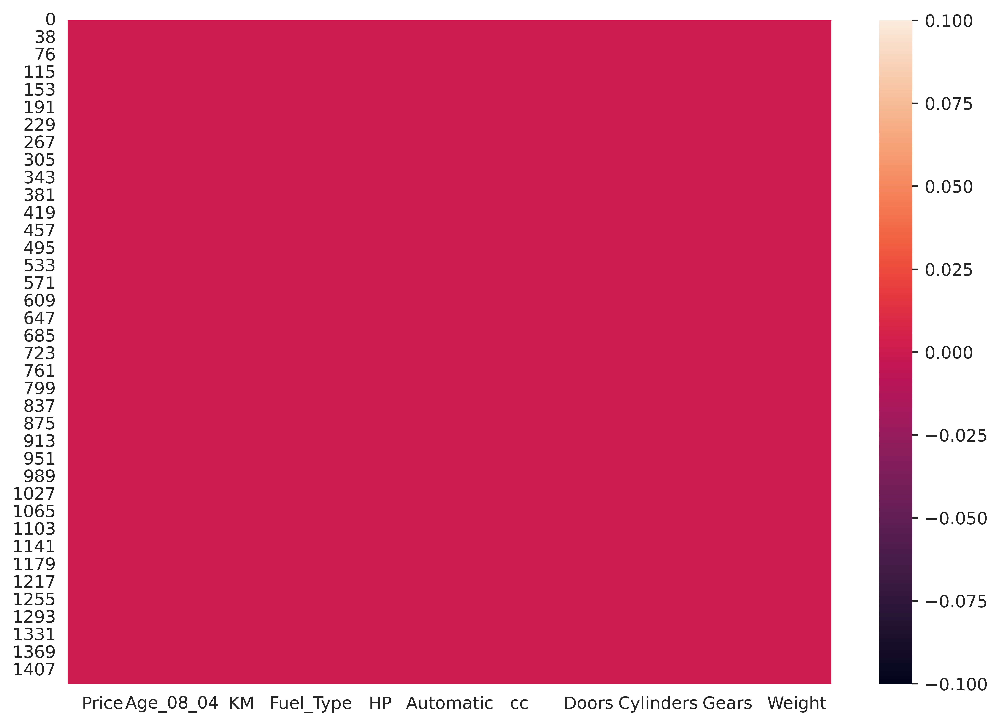

In [14]:
sns.heatmap(df.isnull())

In [15]:
#converting categorial columns into numberical
df.Fuel_Type.value_counts()

Fuel_Type
Petrol    1264
Diesel     154
CNG         17
Name: count, dtype: int64

# **Transformation**

In [16]:
df = pd.get_dummies(df).astype(int)

In [17]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1432,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1433,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1434,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


# **Scaling the data**




In [18]:
#Standardization/Normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [19]:
sc = StandardScaler()
sc_df = sc.fit_transform(df)

In [20]:
sc_df

array([[ 0.77036821, -1.77726827, -0.57595832, ..., -0.109493  ,
         2.88412583, -2.71878886],
       [ 0.83966875, -1.77726827,  0.11647404, ..., -0.109493  ,
         2.88412583, -2.71878886],
       [ 0.89510918, -1.72337979, -0.71670745, ..., -0.109493  ,
         2.88412583, -2.71878886],
       ...,
       [-0.61564265,  0.80937864, -1.37562683, ..., -0.109493  ,
        -0.34672551,  0.36781083],
       [-0.96214536,  0.75549016, -1.37829506, ..., -0.109493  ,
        -0.34672551,  0.36781083],
       [-1.04530601,  1.07882103, -1.82962616, ..., -0.109493  ,
        -0.34672551,  0.36781083]])

In [21]:
sc_df_final = pd.DataFrame(sc_df,columns = df.columns)

In [22]:
sc_df_final

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,0.770368,-1.777268,-0.575958,-0.767351,-0.242983,0.998113,-1.084443,0.0,-0.140475,1.774964,-0.109493,2.884126,-2.718789
1,0.839669,-1.777268,0.116474,-0.767351,-0.242983,0.998113,-1.084443,0.0,-0.140475,1.774964,-0.109493,2.884126,-2.718789
2,0.895109,-1.723380,-0.716707,-0.767351,-0.242983,0.998113,-1.084443,0.0,-0.140475,1.774964,-0.109493,2.884126,-2.718789
3,1.172311,-1.615603,-0.548902,-0.767351,-0.242983,0.998113,-1.084443,0.0,-0.140475,1.774964,-0.109493,2.884126,-2.718789
4,0.839669,-1.400049,-0.802384,-0.767351,-0.242983,0.998113,-1.084443,0.0,-0.140475,1.870688,-0.109493,2.884126,-2.718789
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1430,-0.892845,0.701602,-1.281492,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.140475,-0.905299,-0.109493,-0.346726,0.367811
1431,0.034396,0.863267,-1.322689,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.140475,-1.096747,-0.109493,-0.346726,0.367811
1432,-0.615643,0.809379,-1.375627,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.140475,-1.096747,-0.109493,-0.346726,0.367811
1433,-0.962145,0.755490,-1.378295,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.140475,-1.096747,-0.109493,-0.346726,0.367811


# **Outlier Detection**

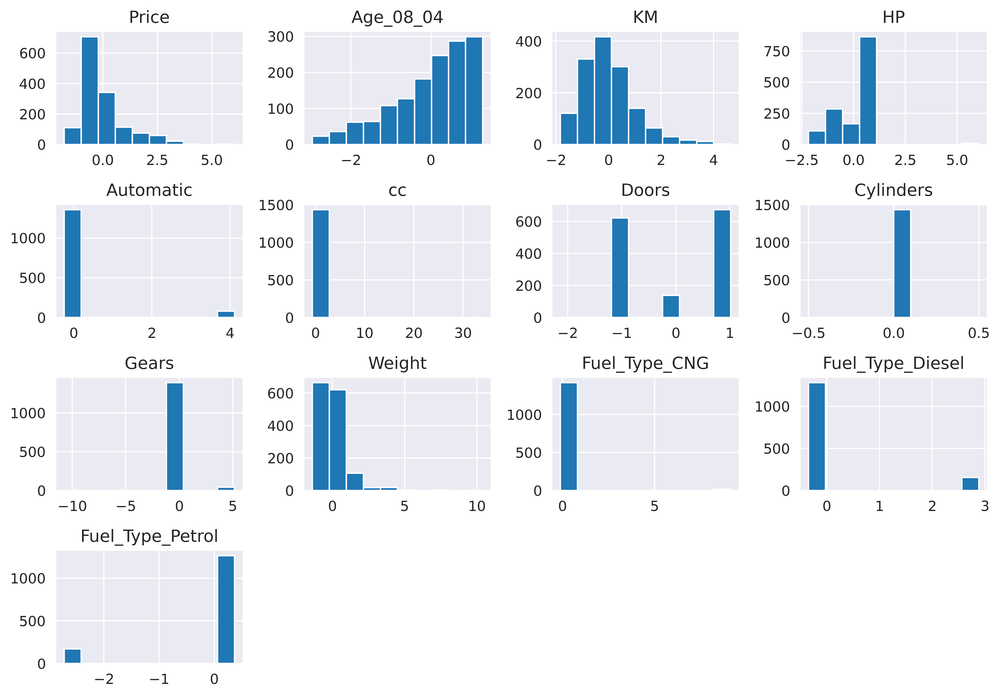

In [23]:
sc_df_final.hist()
plt.tight_layout()
plt.show()

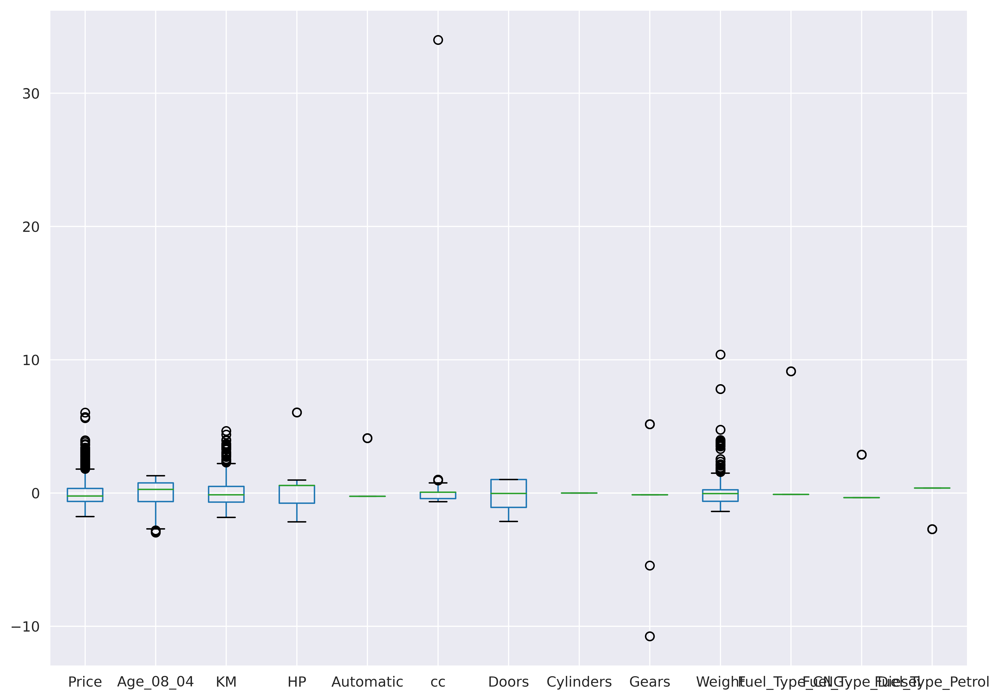

In [24]:
sc_df_final.boxplot()
plt.tight_layout()
plt.show()

# **Outlier Treatment**

In [25]:
# Outlier Detection: User defined Function to calculate Upper Extreme and Lower Extreme value
def outlier_detection(data,colname):
  q1 = data[colname].quantile(0.25)
  q3 = data[colname].quantile(0.75)
  iqr = q3 - q1

  upper_extreme = q3 + (1.5 * iqr)
  lower_extreme = q1 - (1.5 * iqr)

  return upper_extreme,lower_extreme

In [26]:
outlier_detection(sc_df_final,'Price')

(1.796016236453014, -2.0848141504215727)

In [27]:
# Capping Outliers of Price column
sc_df_final.loc[sc_df_final['Price']>1.79,'Price'] = 1.79


In [28]:
outlier_detection(sc_df_final, 'Age_08_04')

(2.857140777872961, -2.7472608583632647)

In [29]:
# Capping Outliers of Age_08_04 column
sc_df_final.loc[sc_df_final['Age_08_04']>-2.74,'Age_08_04'] = -2.74

In [30]:
outlier_detection(sc_df_final, 'KM')

(2.255507273935951, -2.445006703675039)

In [31]:
# Capping Outliers of KM column
sc_df_final.loc[sc_df_final['KM']>2.25,'KM'] = 2.25

In [32]:
outlier_detection(sc_df_final, 'HP')

(2.5712829514328623, -2.770530740897665)

In [33]:
# Capping Outliers of HP column
sc_df_final.loc[sc_df_final['HP']>2.57,'HP'] = 2.57

In [34]:
outlier_detection(sc_df_final, 'Automatic')

(-0.24298269569231482, -0.24298269569231482)

In [35]:
# Capping Outliers of Automatic column
sc_df_final.loc[sc_df_final['Automatic']>-0.24,'Automatic'] = -0.24

In [36]:
outlier_detection(sc_df_final, 'cc')

(0.7623969956414857, -1.1233296808565707)

In [37]:
# Capping Outliers of cc column
sc_df_final.loc[sc_df_final['cc']>0.76,'cc'] = 0.76

In [38]:
outlier_detection(sc_df_final, 'Gears')

(-0.14047507206961815, -0.14047507206961815)

In [39]:
# Capping Outliers of Gears column
sc_df_final.loc[sc_df_final['Gears']>-0.14,'Gears'] = -0.14

In [40]:
sc_df_final.loc[sc_df_final['Gears']<-0.14,'Gears'] = -0.14

In [41]:
outlier_detection(sc_df_final, 'Weight')

(1.535654825785275, -1.9103980691705411)

In [42]:
# Capping Outliers of Weight column
sc_df_final.loc[sc_df_final['Weight']>1.53,'Weight'] = 1.53

In [43]:
outlier_detection(sc_df_final, 'Fuel_Type_CNG')

(-0.10949299750265154, -0.10949299750265154)

In [44]:
# Capping Outliers of Fuel_Type_CNG column
sc_df_final.loc[sc_df_final['Fuel_Type_CNG']>-0.10,'Fuel_Type_CNG'] = -0.10

In [45]:
outlier_detection(sc_df_final, 'Fuel_Type_Diesel')

(-0.3467255099282034, -0.3467255099282034)

In [46]:
# Capping Outliers of Fuel_Type_Diesel column
sc_df_final.loc[sc_df_final['Fuel_Type_Diesel']>-0.34,'Fuel_Type_Diesel'] = -0.34

In [47]:
outlier_detection(sc_df_final, 'Fuel_Type_Petrol')

(0.36781083470526316, 0.36781083470526316)

In [48]:
# Capping Outliers of Fuel_Type_Petrol column
sc_df_final.loc[sc_df_final['Fuel_Type_Petrol']<0.36,'Fuel_Type_Petrol'] = 0.36

<Axes: >

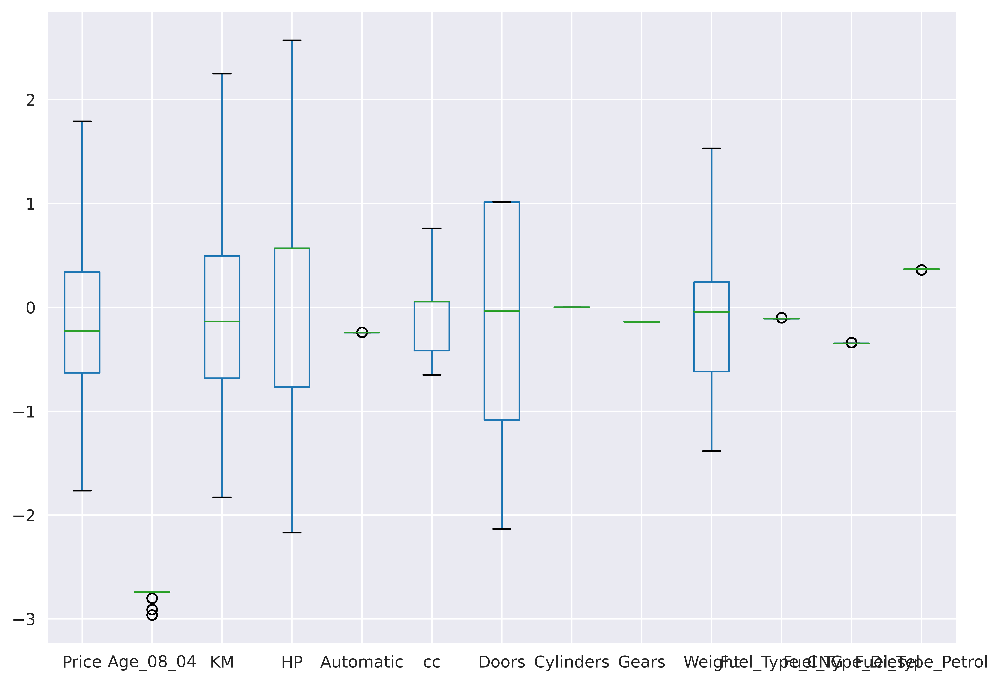

In [49]:
sc_df_final.boxplot()

In [50]:
sc_df_final.corr()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
Price,1.000000,-0.140465,-0.608081,0.254395,0.035841,0.129328,0.183024,NaN,NaN,0.507354,-0.039525,-0.001749,0.014870
Age_08_04,-0.140465,1.000000,0.121086,-0.023812,0.015180,-0.006479,-0.048336,NaN,NaN,-0.070672,0.006840,-0.016633,0.013606
KM,-0.608081,0.121086,1.000000,-0.329564,-0.082213,0.258217,-0.036603,NaN,NaN,0.000977,0.143625,0.376711,-0.407857
HP,0.254395,-0.023812,-0.329564,1.000000,0.022545,0.099396,0.120149,NaN,NaN,0.024780,0.074212,-0.601600,0.549956
Automatic,0.035841,0.015180,-0.082213,0.022545,1.000000,-0.059202,-0.027492,NaN,NaN,0.090542,0.001467,-0.084248,0.079997
cc,0.129328,-0.006479,0.258217,0.099396,-0.059202,1.000000,0.138576,NaN,NaN,0.717632,0.027071,0.697179,-0.675092
Doors,0.183024,-0.048336,-0.036603,0.120149,-0.027492,0.138576,1.000000,NaN,NaN,0.381455,0.009761,0.023538,-0.025746
Cylinders,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gears,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Weight,0.507354,-0.070672,0.000977,0.024780,0.090542,0.717632,0.381455,NaN,NaN,1.000000,0.085189,0.574499,-0.577298


<Axes: >

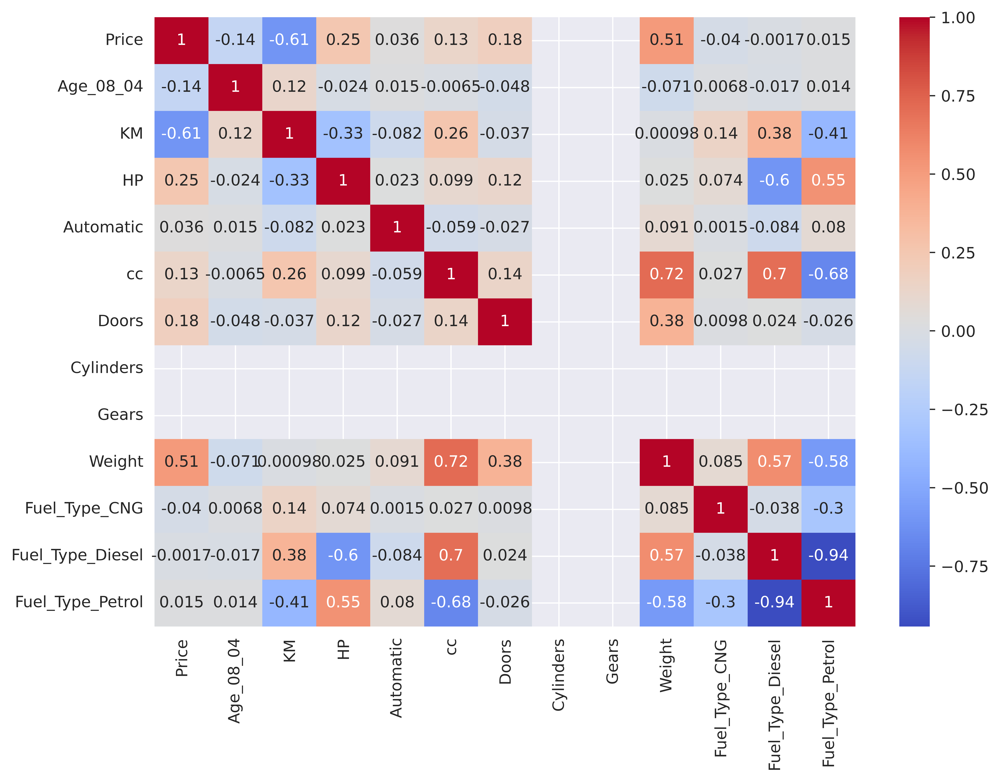

In [51]:
sns.heatmap(sc_df_final.corr(),annot=True, cmap='coolwarm')

# **Model Building**

In [52]:
model = smf.ols('Price~Age_08_04+KM+HP+Automatic+cc+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol',data=sc_df_final).fit()


In [53]:
model.pvalues

Intercept            9.576967e-01
Age_08_04            1.254484e-01
KM                  6.532472e-124
HP                   1.283977e-09
Automatic            8.217537e-08
cc                   1.232888e-18
Doors                8.510024e-08
Cylinders            6.791404e-01
Gears                9.576967e-01
Weight              6.796954e-126
Fuel_Type_CNG        6.025523e-05
Fuel_Type_Diesel     7.743298e-06
Fuel_Type_Petrol     2.622260e-03
dtype: float64

# **Calculate VIF**

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [55]:
data = sc_df_final.drop(columns = ["Price"])

In [56]:
vif = pd.DataFrame()

In [57]:
vif

""


In [58]:
vif['Features'] = data.columns

In [59]:
vif

,Features
0,Age_08_04
1,KM
2,HP
3,Automatic
4,cc
5,Doors
6,Cylinders
7,Gears
8,Weight
9,Fuel_Type_CNG


In [60]:
range(len(data.columns))

range(0, 12)

In [61]:
[variance_inflation_factor(data.values,i) for i in range(len(data.columns))]

[1.0286489042590965,
 1.5134374808123818,
 10.120304292169058,
 1.0918373315303258,
 12.274308447005128,
 1.3189753429912356,
 nan,
 0.00019300096460133666,
 3.3189015079716806,
 inf,
 inf,
 inf]

In [62]:
vif['VIF'] = [variance_inflation_factor(data.values,i) for i in range(len(data.columns))]

In [63]:
vif

,Features,VIF
0,Age_08_04,1.028649
1,KM,1.513437
2,HP,10.120304
3,Automatic,1.091837
4,cc,12.274308
5,Doors,1.318975
6,Cylinders,NaN
7,Gears,0.000193
8,Weight,3.318902
9,Fuel_Type_CNG,inf


# **Dividing the data into x and y**

In [64]:
x = sc_df_final.iloc[:,1:]
x

,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,-2.74,-0.575958,-0.767351,-0.242983,0.760000,-1.084443,0.0,-0.14,1.530000,-0.109493,-0.340000,0.360000
1,-2.74,0.116474,-0.767351,-0.242983,0.760000,-1.084443,0.0,-0.14,1.530000,-0.109493,-0.340000,0.360000
2,-2.74,-0.716707,-0.767351,-0.242983,0.760000,-1.084443,0.0,-0.14,1.530000,-0.109493,-0.340000,0.360000
3,-2.74,-0.548902,-0.767351,-0.242983,0.760000,-1.084443,0.0,-0.14,1.530000,-0.109493,-0.340000,0.360000
4,-2.74,-0.802384,-0.767351,-0.242983,0.760000,-1.084443,0.0,-0.14,1.530000,-0.109493,-0.340000,0.360000
...,...,...,...,...,...,...,...,...,...,...,...,...
1430,-2.74,-1.281492,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.14,-0.905299,-0.109493,-0.346726,0.367811
1431,-2.74,-1.322689,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.14,-1.096747,-0.109493,-0.346726,0.367811
1432,-2.74,-1.375627,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.14,-1.096747,-0.109493,-0.346726,0.367811
1433,-2.74,-1.378295,-1.034441,-0.242983,-0.651898,-1.084443,0.0,-0.14,-1.096747,-0.109493,-0.346726,0.367811


In [65]:
y = sc_df_final['Price']
y

0       0.770368
1       0.839669
2       0.895109
3       1.172311
4       0.839669
          ...   
1430   -0.892845
1431    0.034396
1432   -0.615643
1433   -0.962145
1434   -1.045306
Name: Price, Length: 1435, dtype: float64

In [66]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

## **Lasso (L1) Regression**

In [67]:
l1 = Lasso()
l1.fit(xtrain,ytrain)
l1.score(xtrain,ytrain),l1.score(xtest,ytest)

(0.0, -0.0007227441927837308)

In [68]:
l1.coef_

array([-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -0., -0.,  0.])

## **Hyperparameter Tuning**

In [69]:
for i in range(100,200):
  l1 = Lasso(alpha = i)
  l1.fit(xtrain,ytrain)
  print(f"Alpha: {i} Train: {l1.score(xtrain,ytrain)} Test: {l1.score(xtest,ytest)}")

Alpha: 100 Train: 0.0 Test: -0.0007227441927837308
Alpha: 101 Train: 0.0 Test: -0.0007227441927837308
Alpha: 102 Train: 0.0 Test: -0.0007227441927837308
Alpha: 103 Train: 0.0 Test: -0.0007227441927837308
Alpha: 104 Train: 0.0 Test: -0.0007227441927837308
Alpha: 105 Train: 0.0 Test: -0.0007227441927837308
Alpha: 106 Train: 0.0 Test: -0.0007227441927837308
Alpha: 107 Train: 0.0 Test: -0.0007227441927837308
Alpha: 108 Train: 0.0 Test: -0.0007227441927837308
Alpha: 109 Train: 0.0 Test: -0.0007227441927837308
Alpha: 110 Train: 0.0 Test: -0.0007227441927837308
Alpha: 111 Train: 0.0 Test: -0.0007227441927837308
Alpha: 112 Train: 0.0 Test: -0.0007227441927837308
Alpha: 113 Train: 0.0 Test: -0.0007227441927837308
Alpha: 114 Train: 0.0 Test: -0.0007227441927837308
Alpha: 115 Train: 0.0 Test: -0.0007227441927837308
Alpha: 116 Train: 0.0 Test: -0.0007227441927837308
Alpha: 117 Train: 0.0 Test: -0.0007227441927837308
Alpha: 118 Train: 0.0 Test: -0.0007227441927837308
Alpha: 119 Train: 0.0 Test: -0.

In [70]:
l1 = Lasso(alpha = 175)
l1.fit(xtrain,ytrain)
l1.score(xtrain,ytrain),l1.score(xtest,ytest)

(0.0, -0.0007227441927837308)

In [71]:
l1.coef_

array([-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -0., -0.,  0.])

# **Ridge (L2) Regression**

In [72]:
l2 = Ridge()
l2.fit(xtrain,ytrain)
l2.score(xtrain,ytrain),l1.score(xtest,ytest)

(0.6411625282608913, -0.0007227441927837308)

In [73]:
for i in range(1,100):
  l2 = Ridge(alpha = i)
  l2.fit(xtrain,ytrain)
  print(f"Alpha: {i} Train: {l2.score(xtrain,ytrain)} Test: {l2.score(xtest,ytest)}")

Alpha: 1 Train: 0.6411625282608913 Test: 0.7008587627199522
Alpha: 2 Train: 0.6409877659787724 Test: 0.7003280154707727
Alpha: 3 Train: 0.6408750893821982 Test: 0.6998208941290027
Alpha: 4 Train: 0.6407659781925803 Test: 0.6993180689989291
Alpha: 5 Train: 0.6406484572173601 Test: 0.6988155864055217
Alpha: 6 Train: 0.640519380146831 Test: 0.6983125515112311
Alpha: 7 Train: 0.6403781744147945 Test: 0.6978089529649851
Alpha: 8 Train: 0.6402251796376145 Test: 0.6973050733076542
Alpha: 9 Train: 0.6400610809828515 Test: 0.6968012880201466
Alpha: 10 Train: 0.6398866842872218 Test: 0.6962979874986189
Alpha: 11 Train: 0.6397028181765494 Test: 0.6957955448778421
Alpha: 12 Train: 0.6395102894699642 Test: 0.6952943029715177
Alpha: 13 Train: 0.6393098629595557 Test: 0.6947945697940567
Alpha: 14 Train: 0.6391022530367942 Test: 0.6942966180982688
Alpha: 15 Train: 0.6388881213016842 Test: 0.6938006868051714
Alpha: 16 Train: 0.638668077241365 Test: 0.6933069832856831
Alpha: 17 Train: 0.6384426804633719

In [74]:
l2 = Ridge(alpha = 8)
l2.fit(xtrain,ytrain)
l2.score(xtrain,ytrain),l2.score(xtest,ytest)

(0.6402251796376145, 0.6973050733076542)

In [75]:
l2.coef_

array([-0.04536839, -0.45812481,  0.08345336, -0.00622911, -0.40204183,
       -0.05680879,  0.        ,  0.        ,  0.75583661, -0.00332073,
        0.00353079, -0.00136828])

# **Subset selection**

In [76]:
model = smf.ols('Price~Age_08_04+KM+HP+Automatic+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol',data=sc_df_final).fit()
model.rsquared, model.aic

(0.6504850542177927, 2026.5289865563586)

In [77]:
# Consider HP and exclude cc
model2 = smf.ols('Price~Age_08_04+KM+HP+Automatic+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol',data=sc_df_final).fit()
model2.rsquared, model2.aic

(0.6504850542177927, 2026.5289865563586)

In [78]:
# Consider cc and exclude HP
model3 = smf.ols('Price~Age_08_04+KM+Automatic+cc+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol',data=sc_df_final).fit()
model3.rsquared, model3.aic

# r square for cc is high and low aic value for cc so consider cc column and drop HP column
# this is conclusion

(0.6603556480173118, 1985.4201433159087)

# **Model Validation Techniques**

 # **Residual Analysis**

In [79]:
# create final model
model = smf.ols('Price~Age_08_04+KM+Automatic+cc+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol',data=sc_df_final).fit()
model.rsquared

0.6603556480173118

In [80]:
import statsmodels.api as sm

In [81]:
df.head()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0


In [82]:
model.fittedvalues

0       1.097548
1       0.777278
2       1.162649
3       1.085034
4       1.202277
          ...   
1430    0.181899
1431    0.034685
1432    0.059170
1433    0.060404
1434    1.458793
Length: 1435, dtype: float64

In [83]:
model.params

Intercept          -4.946906e+01
Age_08_04          -2.304473e+00
KM                 -4.625288e-01
Automatic          -1.193990e+02
cc                 -3.995065e-01
Doors              -8.281469e-02
Cylinders           3.007790e-15
Gears               6.925668e+00
Weight              8.684848e-01
Fuel_Type_CNG      -9.503121e-01
Fuel_Type_Diesel   -1.611643e+01
Fuel_Type_Petrol    2.568068e+01
dtype: float64

In [84]:
model.resid

0      -0.327180
1       0.062390
2      -0.267540
3       0.087277
4      -0.362608
          ...   
1430   -1.074744
1431   -0.000288
1432   -0.674812
1433   -1.022549
1434   -2.504099
Length: 1435, dtype: float64

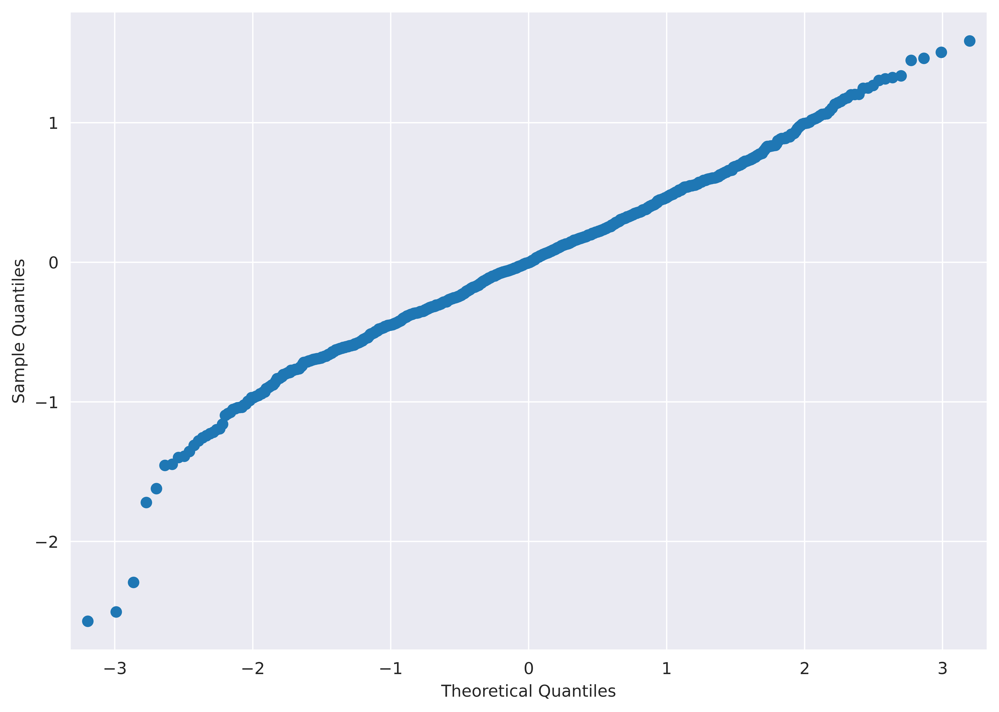

In [85]:
# Q-Q Plot
sm.qqplot(model.resid);

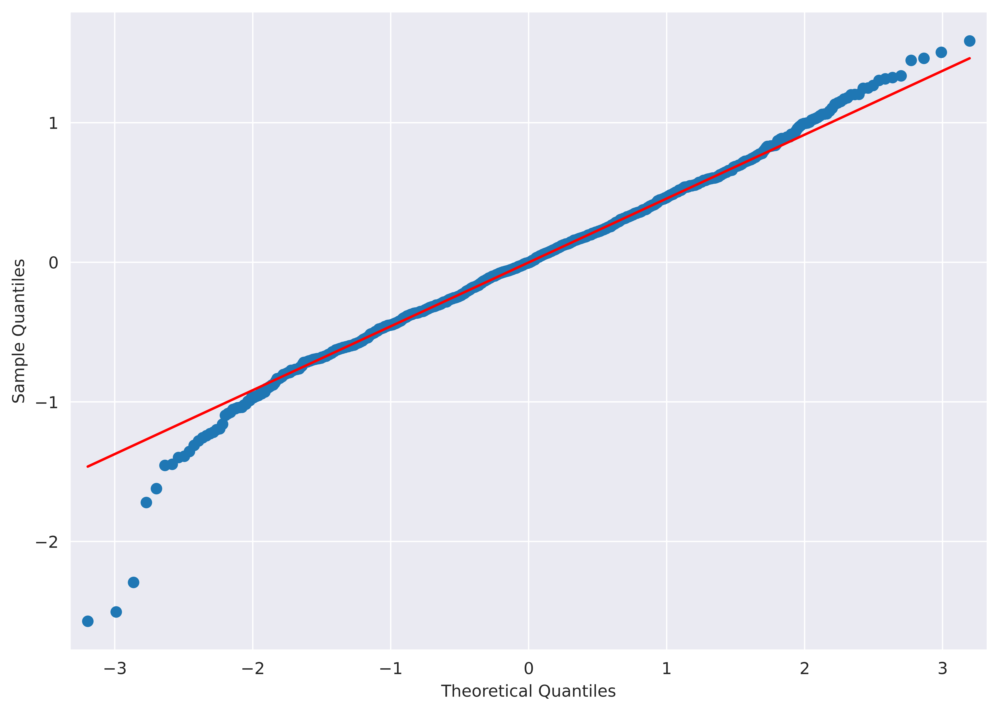

In [89]:
sm.qqplot(model.resid, line='q');

In [90]:
np.argmax(model.resid),np.max(model.resid)

(43, 1.5857493728525498)

# **Residual plot of Homoscedasticity**

In [91]:
model.params

Intercept          -4.946906e+01
Age_08_04          -2.304473e+00
KM                 -4.625288e-01
Automatic          -1.193990e+02
cc                 -3.995065e-01
Doors              -8.281469e-02
Cylinders           3.007790e-15
Gears               6.925668e+00
Weight              8.684848e-01
Fuel_Type_CNG      -9.503121e-01
Fuel_Type_Diesel   -1.611643e+01
Fuel_Type_Petrol    2.568068e+01
dtype: float64

In [92]:
model.fittedvalues

0       1.097548
1       0.777278
2       1.162649
3       1.085034
4       1.202277
          ...   
1430    0.181899
1431    0.034685
1432    0.059170
1433    0.060404
1434    1.458793
Length: 1435, dtype: float64

In [93]:
model.resid

0      -0.327180
1       0.062390
2      -0.267540
3       0.087277
4      -0.362608
          ...   
1430   -1.074744
1431   -0.000288
1432   -0.674812
1433   -1.022549
1434   -2.504099
Length: 1435, dtype: float64

Text(0, 0.5, 'Errors')

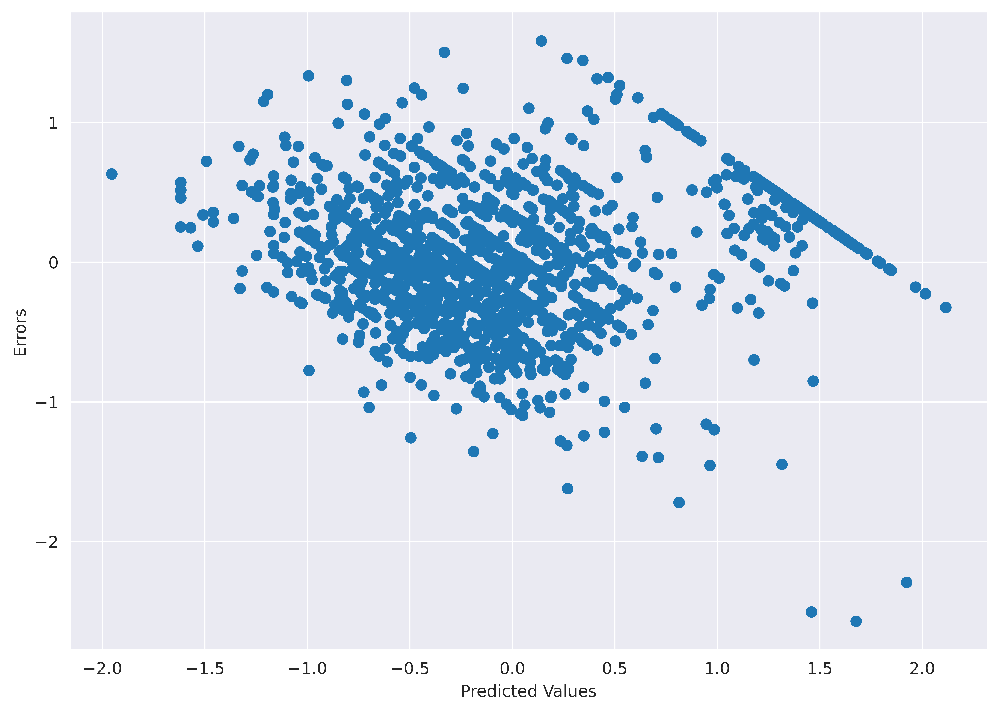

In [86]:
plt.scatter(model.fittedvalues, model.resid)
plt.xlabel('Predicted Values')
plt.ylabel('Errors')

# **3. Residual Vs. Regressor (x)**


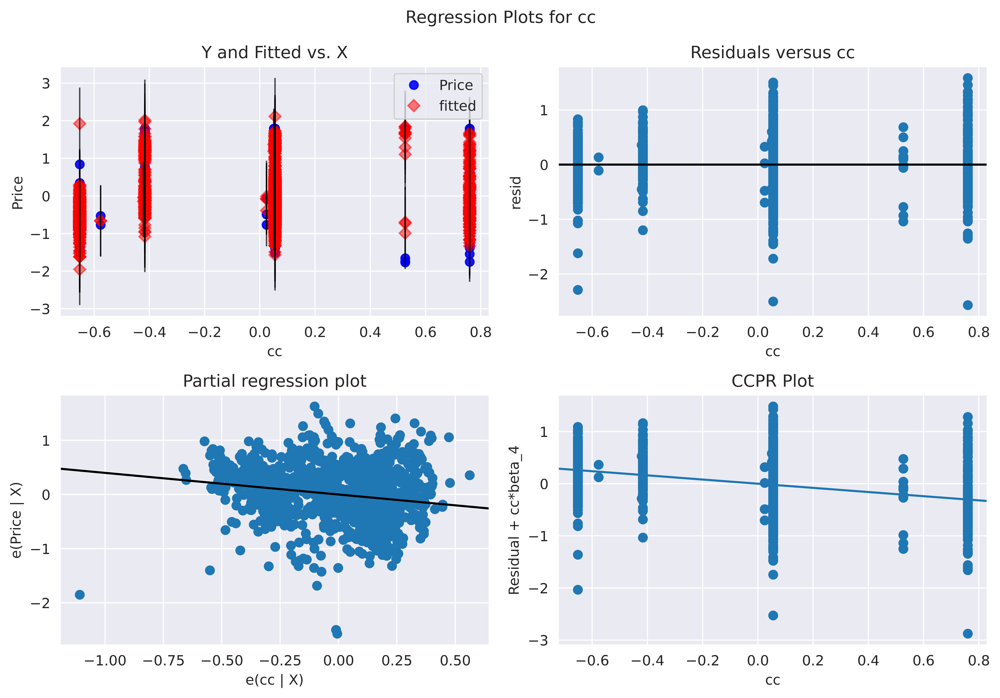

In [87]:
sm.graphics.plot_regress_exog(model,'cc');

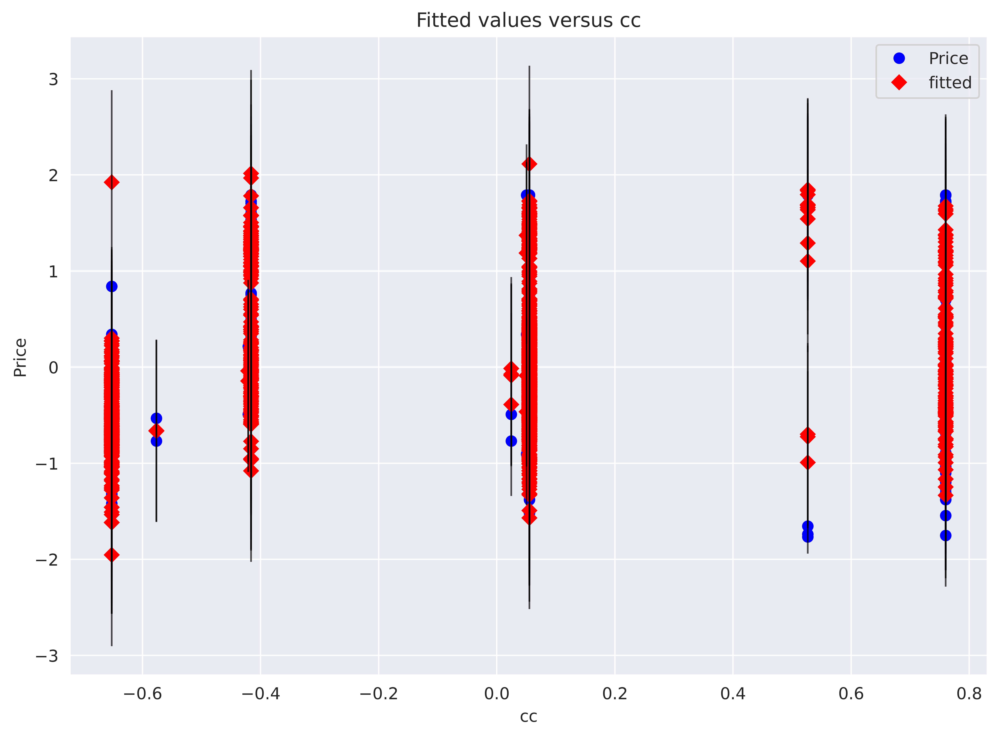

In [88]:
sm.graphics.plot_fit(model,'cc');

# **MODEL DELETION TECHNIQUES**

In [97]:
model

In [98]:
inf = model.get_influence()

In [99]:
# calculate the cook's distance
c,p = inf.cooks_distance

In [ ]:
c

Text(0, 0.5, "Cook's Distance")

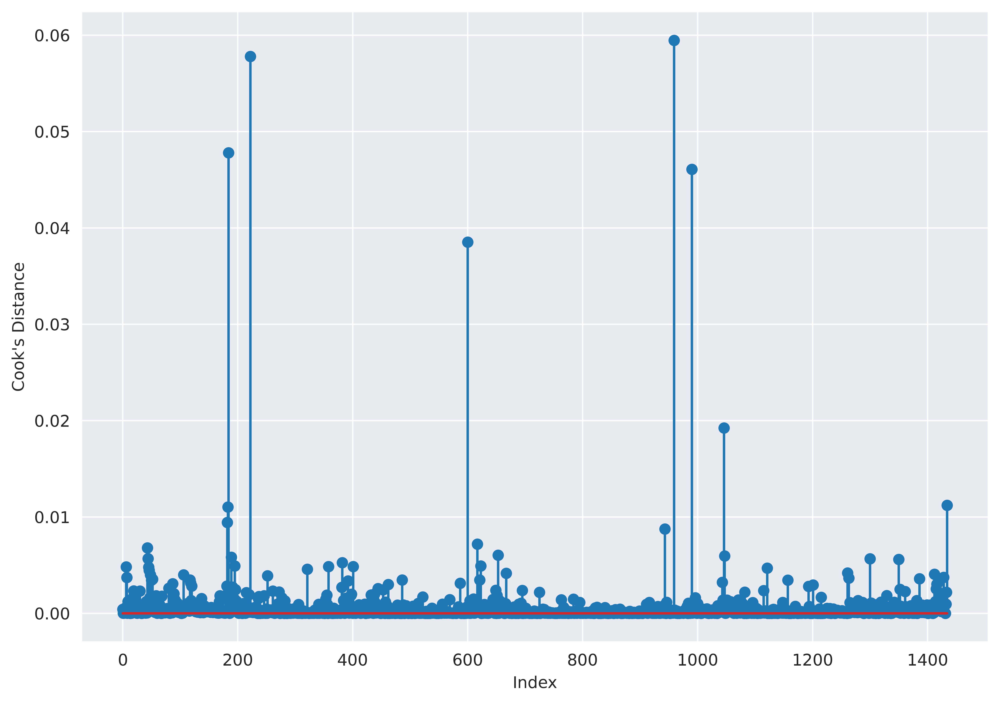

In [100]:
# Cook's distance plot ## cook's distance is the method name that find out the outliers
plt.stem(c)
plt.xlabel('Index')
plt.ylabel('Cook\'s Distance')

In [101]:
np.argmax(c), np.max(c)

(959, 0.059468821072733685)

In [102]:
df.iloc[[43]]

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
43,16950,27,110404,90,0,2000,5,4,5,1255,0,1,0


In [103]:
df.head()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0


In [104]:
# Influence Plot
from statsmodels.graphics.regressionplots import influence_plot

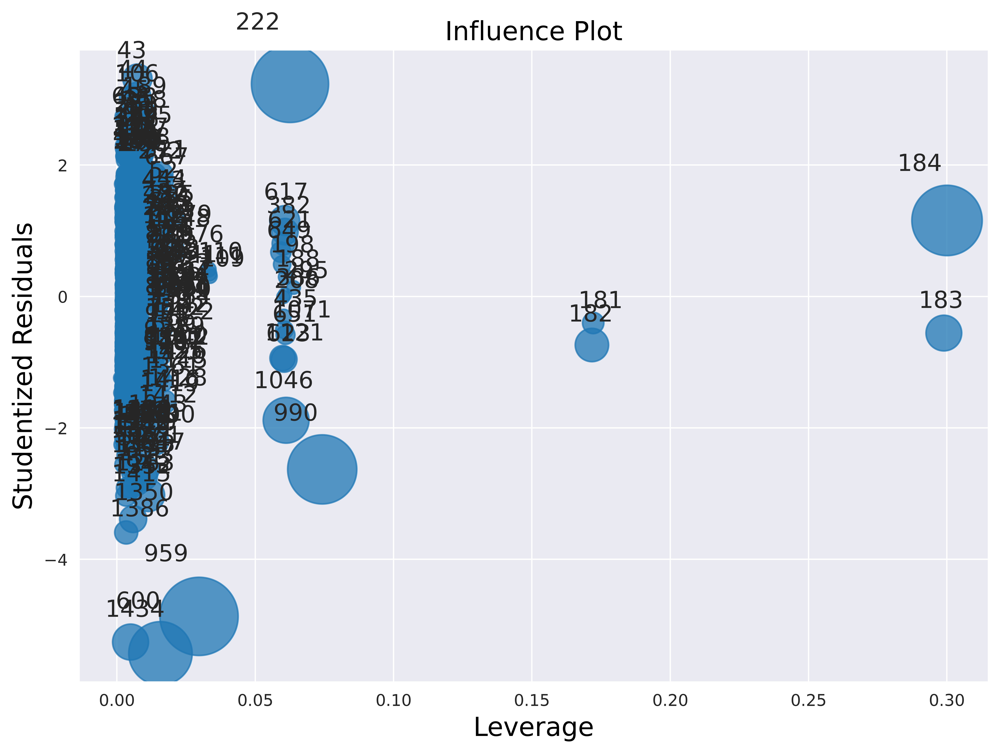

In [105]:
influence_plot(model);

In [106]:
# Calculate cutoff
k = len(df.columns)
n = len(df)
leverage = 3 * (k + 1) / n
leverage

0.02926829268292683

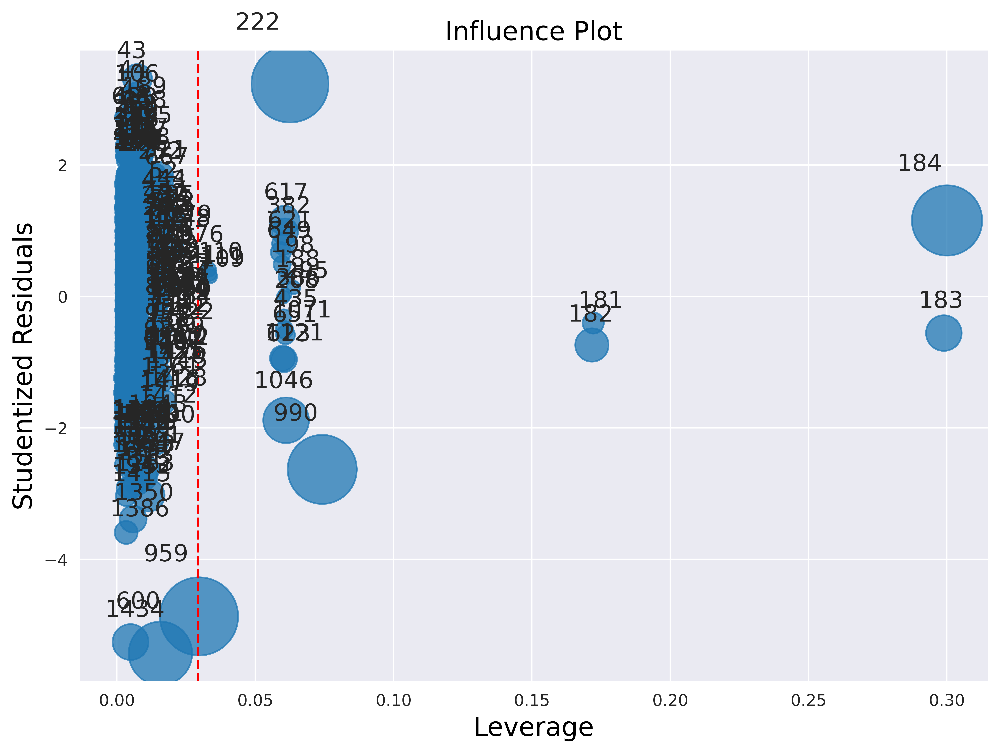

In [107]:
influence_plot(model)
plt.axvline(leverage, linestyle = '--', color = 'red')

# **Improving the Model**

In [108]:
df.drop(index=43,inplace=True)

In [109]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1432,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1433,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1434,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


In [111]:
df.reset_index(inplace=True)

In [112]:
df

,index,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,1431,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1430,1432,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1431,1433,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1432,1434,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


In [113]:
df.drop(columns=['index'],inplace=True)

In [114]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1430,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1431,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1432,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


In [115]:
final_model = smf.ols('Price~Age_08_04+KM+Automatic+cc+Doors+Cylinders+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data=df).fit()

In [116]:
final_model.rsquared # model accuracy is increased from 66% to 85%

0.8594086447383783